# Customer Segmentation & Predictive Analytics for E-Commerce

## Advanced Machine Learning Assignment

This notebook covers:
1. Exploratory Data Analysis (EDA)
2. Data Preprocessing & Feature Engineering
3. Unsupervised Learning - Customer Segmentation
4. Supervised Learning - Churn Prediction
5. Model Interpretation & Business Insights


## Part 1: Exploratory Data Analysis


### 1.1 Initial Inspection


In [53]:
# Data Manipulation
import pandas as pd
import numpy as np

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import warnings
import os
import joblib
warnings.filterwarnings('ignore')

# Preprocessing
from sklearn.preprocessing import StandardScaler, RobustScaler, MinMaxScaler, LabelEncoder
from sklearn.impute import KNNImputer, SimpleImputer
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from imblearn.over_sampling import SMOTE, ADASYN
from imblearn.under_sampling import RandomUnderSampler
from imblearn.combine import SMOTETomek

# Unsupervised Learning
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering
from sklearn.mixture import GaussianMixture
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
try:
    from umap import UMAP
    UMAP_AVAILABLE = True
except ImportError:
    UMAP_AVAILABLE = False
    print("UMAP not available. Install with: pip install umap-learn")

# Supervised Learning
from sklearn.ensemble import RandomForestClassifier, VotingClassifier, StackingClassifier, GradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
try:
    from catboost import CatBoostClassifier
    CATBOOST_AVAILABLE = True
except ImportError:
    CATBOOST_AVAILABLE = False
    print("CatBoost not available. Install with: pip install catboost")

# Model Evaluation
from sklearn.metrics import (classification_report, roc_auc_score, confusion_matrix, 
                            roc_curve, precision_recall_curve, f1_score, 
                            precision_score, recall_score, accuracy_score,
                            silhouette_score, davies_bouldin_score, calinski_harabasz_score)
from sklearn.model_selection import (cross_val_score, StratifiedKFold, 
                                     GridSearchCV, RandomizedSearchCV, train_test_split)
from sklearn.inspection import PartialDependenceDisplay

# Interpretation
try:
    import shap
    SHAP_AVAILABLE = True
except ImportError:
    SHAP_AVAILABLE = False
    print("SHAP not available. Install with: pip install shap")

try:
    from lime import lime_tabular
    LIME_AVAILABLE = True
except ImportError:
    LIME_AVAILABLE = False
    print("LIME not available. Install with: pip install lime")

# Statistical Analysis
from scipy import stats
from scipy.stats import zscore
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tsa.statespace.sarimax import SARIMAX

# Set style
sns.set_style("whitegrid")
plt.rcParams['figure.figsize'] = (12, 6)
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 100)

print("Libraries imported successfully!")


Libraries imported successfully!


In [54]:
# Load dataset
DATA_PATH = 'ecommerce_customer_churn_dataset.csv'
df_raw = pd.read_csv(r'C:\Users\tejas\Downloads\ecommerce_customer_churn_dataset (1).csv')
df = df_raw.copy()
print(f"Dataset shape: {df.shape}")
df.head()


Dataset shape: (50000, 25)


,Age,Gender,Country,City,Membership_Years,Login_Frequency,Session_Duration_Avg,Pages_Per_Session,Cart_Abandonment_Rate,Wishlist_Items,Total_Purchases,Average_Order_Value,Days_Since_Last_Purchase,Discount_Usage_Rate,Returns_Rate,Email_Open_Rate,Customer_Service_Calls,Product_Reviews_Written,Social_Media_Engagement_Score,Mobile_App_Usage,Payment_Method_Diversity,Lifetime_Value,Credit_Balance,Churned,Signup_Quarter
0,43.0,Male,France,Marseille,2.9,14.0,27.4,6.0,50.6,3.0,9.0,94.72,34.0,46.40,2.0,17.9,9.0,4.0,16.3,20.8,1.0,953.33,2278.0,0,Q1
1,36.0,Male,UK,Manchester,1.6,15.0,42.7,10.3,37.7,1.0,19.5,82.45,71.0,57.96,9.2,42.8,7.0,3.0,NaN,23.3,3.0,1067.47,3028.0,0,Q4
2,45.0,Female,Canada,Vancouver,2.9,10.0,24.8,1.6,70.9,1.0,9.1,165.52,11.0,12.24,11.5,0.0,4.0,1.0,NaN,8.8,NaN,1289.75,2317.0,0,Q4
3,56.0,Female,USA,New York,2.6,10.0,38.4,14.8,41.7,9.0,15.0,147.33,47.0,44.10,5.4,41.4,2.0,5.0,85.9,31.0,3.0,2340.92,2674.0,0,Q1
4,35.0,Male,India,Delhi,3.1,29.0,51.4,NaN,19.1,9.0,32.5,141.30,73.0,25.20,5.5,37.9,1.0,11.0,83.0,50.4,4.0,3041.29,5354.0,0,Q4


In [55]:
# Basic info
print("Data types\n", df.dtypes)
print("\nMissing values per column:\n", df.isnull().sum())
print("\nStatistical Summary:")
df.describe(include='all').T


Data types
 Age                              float64
Gender                            object
Country                           object
City                              object
Membership_Years                 float64
Login_Frequency                  float64
Session_Duration_Avg             float64
Pages_Per_Session                float64
Cart_Abandonment_Rate            float64
Wishlist_Items                   float64
Total_Purchases                  float64
Average_Order_Value              float64
Days_Since_Last_Purchase         float64
Discount_Usage_Rate              float64
Returns_Rate                     float64
Email_Open_Rate                  float64
Customer_Service_Calls           float64
Product_Reviews_Written          float64
Social_Media_Engagement_Score    float64
Mobile_App_Usage                 float64
Payment_Method_Diversity         float64
Lifetime_Value                   float64
Credit_Balance                   float64
Churned                            int64
Sign

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Age,47505.0,NaN,NaN,NaN,37.802968,11.834668,5.0,29.0,38.0,46.0,200.0
Gender,50000,3,Female,25116,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Country,50000,8,USA,17384,NaN,NaN,NaN,NaN,NaN,NaN,NaN
City,50000,40,Houston,3549,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Membership_Years,50000.0,NaN,NaN,NaN,2.984009,2.059105,0.1,1.4,2.5,4.0,10.0
Login_Frequency,50000.0,NaN,NaN,NaN,11.62466,7.810657,0.0,6.0,11.0,17.0,46.0
Session_Duration_Avg,46601.0,NaN,NaN,NaN,27.660754,10.871013,1.0,19.7,26.8,34.7,75.6
Pages_Per_Session,47000.0,NaN,NaN,NaN,8.737811,3.77822,1.0,6.0,8.4,11.2,24.1
Cart_Abandonment_Rate,50000.0,NaN,NaN,NaN,57.079973,16.282723,0.0,46.4,58.1,68.7,143.74335
Wishlist_Items,46000.0,NaN,NaN,NaN,4.298391,3.189754,0.0,2.0,4.0,6.0,28.0


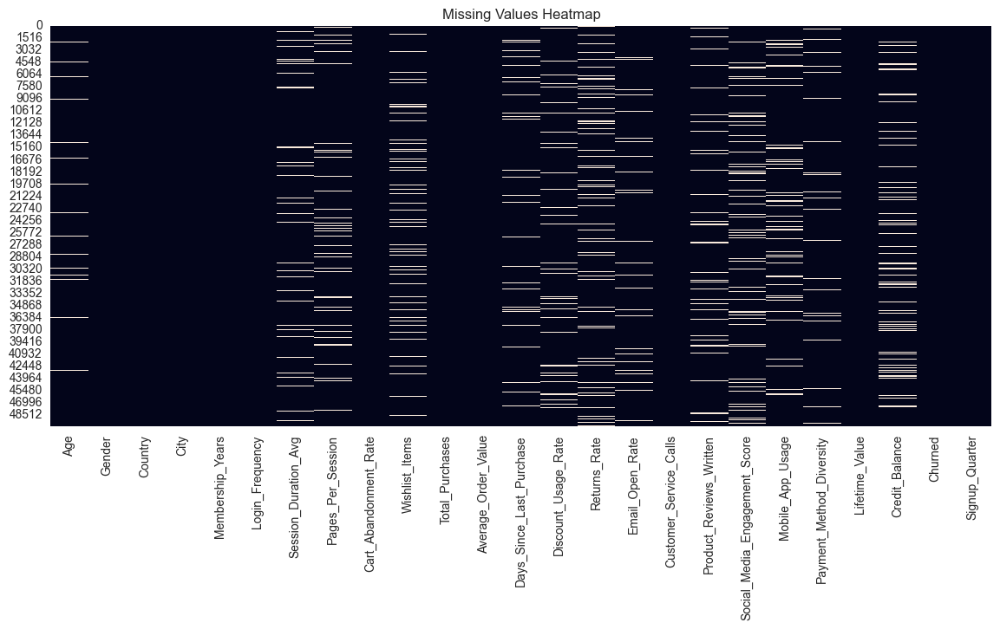

In [56]:
# Missing value heatmap
plt.figure(figsize=(14,6))
sns.heatmap(df.isnull(), cbar=False)
plt.title('Missing Values Heatmap')
plt.show()


### 1.2 Advanced EDA


In [57]:
numeric_cols = df.select_dtypes(include=[np.number]).columns.tolist()
cat_cols = df.select_dtypes(include='object').columns.tolist()
print(f"Numeric cols: {len(numeric_cols)} | Categorical cols: {len(cat_cols)}")


Numeric cols: 21 | Categorical cols: 4


In [58]:
def detect_outliers_iqr(data, feature):
    Q1 = data[feature].quantile(0.25)
    Q3 = data[feature].quantile(0.75)
    IQR = Q3 - Q1
    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR
    return data[(data[feature] < lower) | (data[feature] > upper)]

iqr_outlier_counts = {col: len(detect_outliers_iqr(df, col)) for col in numeric_cols}
iqr_outlier_counts


{'Age': 126,
 'Membership_Years': 1581,
 'Login_Frequency': 309,
 'Session_Duration_Avg': 300,
 'Pages_Per_Session': 275,
 'Cart_Abandonment_Rate': 323,
 'Wishlist_Items': 858,
 'Total_Purchases': 628,
 'Average_Order_Value': 1005,
 'Days_Since_Last_Purchase': 2313,
 'Discount_Usage_Rate': 101,
 'Returns_Rate': 1204,
 'Email_Open_Rate': 238,
 'Customer_Service_Calls': 1185,
 'Product_Reviews_Written': 1090,
 'Social_Media_Engagement_Score': 233,
 'Mobile_App_Usage': 270,
 'Payment_Method_Diversity': 2439,
 'Lifetime_Value': 1684,
 'Credit_Balance': 209,
 'Churned': 0}

In [59]:
# Z-score based outlier detection (|z| > 3)
z_scores = np.abs(stats.zscore(df[numeric_cols].select_dtypes(include=[np.number]), nan_policy='omit'))
z_outliers = (z_scores > 3).sum(axis=0)
dict(zip(numeric_cols, z_outliers))


{'Age': 76,
 'Membership_Years': 817,
 'Login_Frequency': 163,
 'Session_Duration_Avg': 137,
 'Pages_Per_Session': 137,
 'Cart_Abandonment_Rate': 150,
 'Wishlist_Items': 508,
 'Total_Purchases': 275,
 'Average_Order_Value': 25,
 'Days_Since_Last_Purchase': 914,
 'Discount_Usage_Rate': 82,
 'Returns_Rate': 199,
 'Email_Open_Rate': 146,
 'Customer_Service_Calls': 241,
 'Product_Reviews_Written': 569,
 'Social_Media_Engagement_Score': 161,
 'Mobile_App_Usage': 139,
 'Payment_Method_Diversity': 0,
 'Lifetime_Value': 709,
 'Credit_Balance': 112,
 'Churned': 0}

In [60]:
from sklearn.ensemble import IsolationForest
iso_forest = IsolationForest(contamination=0.05, random_state=42)
iso_preds = iso_forest.fit_predict(df[numeric_cols].fillna(df[numeric_cols].median()))
df['anomaly_iforest'] = np.where(iso_preds == -1, 1, 0)
df['anomaly_iforest'].value_counts()


0    47500
1     2500
Name: anomaly_iforest, dtype: int64

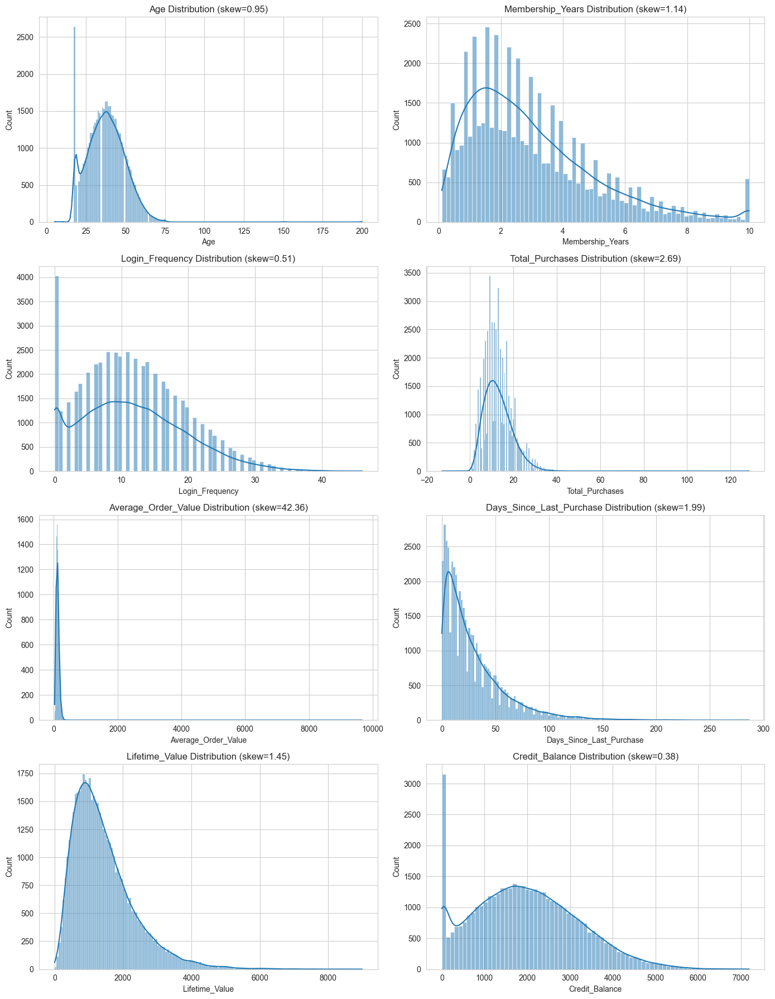

In [61]:
# Distribution plots for key numeric features
key_features = ['Age', 'Membership_Years', 'Login_Frequency', 'Total_Purchases',
                'Average_Order_Value', 'Days_Since_Last_Purchase', 'Lifetime_Value',
                'Credit_Balance']
fig, axes = plt.subplots(len(key_features)//2, 2, figsize=(14,18))
axes = axes.flatten()
for i, col in enumerate(key_features):
    sns.histplot(df[col], kde=True, ax=axes[i])
    axes[i].set_title(f'{col} Distribution (skew={df[col].skew():.2f})')
plt.tight_layout()
plt.show()


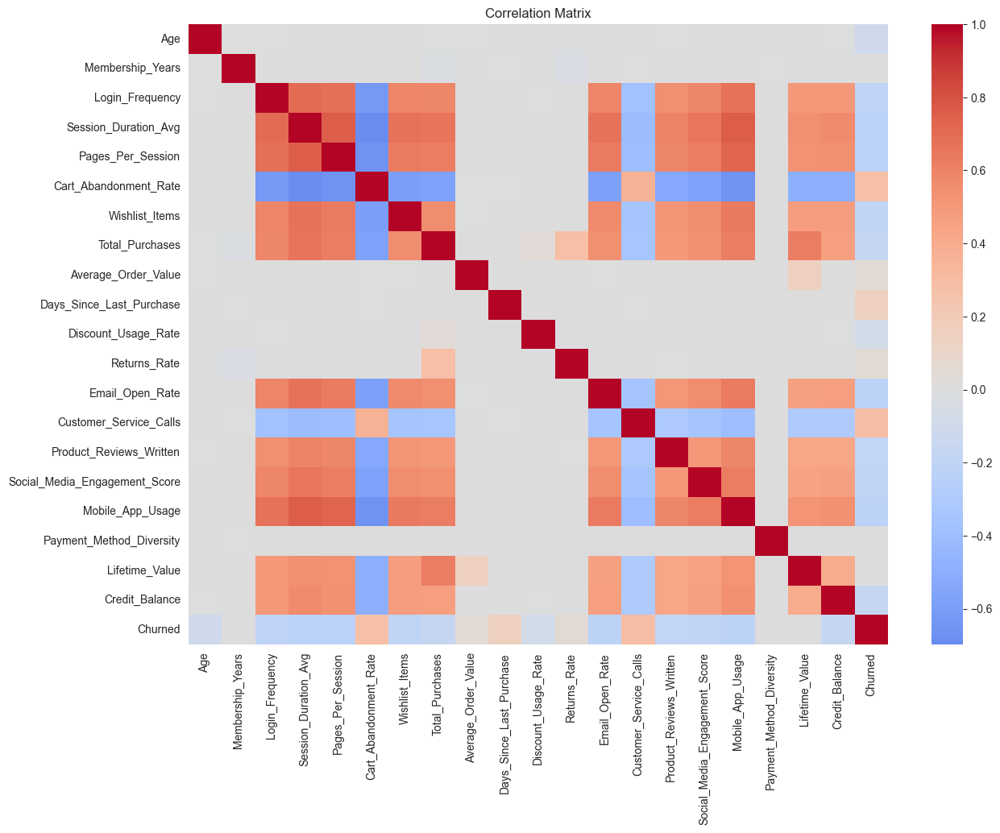

,feature,VIF
3,Session_Duration_Avg,24.590391
4,Pages_Per_Session,17.646776
16,Mobile_App_Usage,14.143337
5,Cart_Abandonment_Rate,13.813631
7,Total_Purchases,12.636813
0,Age,10.779331
2,Login_Frequency,7.839589
18,Lifetime_Value,7.018096
12,Email_Open_Rate,6.675231
13,Customer_Service_Calls,6.605569


In [62]:
# Correlation matrix
plt.figure(figsize=(14,10))
sns.heatmap(df[numeric_cols].corr(), cmap='coolwarm', center=0)
plt.title('Correlation Matrix')
plt.show()

# VIF computation for multicollinearity
vif_df = pd.DataFrame()
vif_df['feature'] = numeric_cols
vif_df['VIF'] = [variance_inflation_factor(df[numeric_cols].fillna(df[numeric_cols].median()).values, i)
                 for i in range(len(numeric_cols))]
vif_df.sort_values(by='VIF', ascending=False).head(15)


In [63]:
# Class imbalance overview
churn_counts = df['Churned'].value_counts()
fig = px.pie(values=churn_counts.values, names=['Retained','Churned'], title='Churn Distribution')
fig.show()

print(churn_counts)
print(f"Churn rate: {churn_counts.get(1,0)/churn_counts.sum():.2%}")


0    35550
1    14450
Name: Churned, dtype: int64
Churn rate: 28.90%


### 1.3 Insight Generation


In [64]:
# Generate insights
insights = {}
insights['avg_login_churn'] = df.groupby('Churned')['Login_Frequency'].mean()
insights['avg_discount_churn'] = df.groupby('Churned')['Discount_Usage_Rate'].mean()
insights['cluster_signup'] = df.groupby(['Signup_Quarter','Churned']).size().unstack().fillna(0)
insights['country_churn'] = (df.groupby('Country')['Churned'].mean().sort_values(ascending=False).head(10))
insights['membership_effect'] = df.groupby(pd.cut(df['Membership_Years'], bins=[0,2,5,10]))['Churned'].mean()
insights


{'avg_login_churn': Churned
 0    12.642391
 1     9.120830
 Name: Login_Frequency, dtype: float64,
 'avg_discount_churn': Churned
 0    43.053423
 1    39.424370
 Name: Discount_Usage_Rate, dtype: float64,
 'cluster_signup': Churned            0     1
 Signup_Quarter            
 Q1              8802  3651
 Q2              8806  3715
 Q3              8988  3570
 Q4              8954  3514,
 'country_churn': Country
 Australia    0.298941
 Canada       0.293541
 USA          0.290842
 India        0.290148
 Germany      0.288325
 UK           0.287895
 Japan        0.278257
 France       0.272863
 Name: Churned, dtype: float64,
 'membership_effect': Membership_Years
 (0, 2]     0.287334
 (2, 5]     0.291250
 (5, 10]    0.286641
 Name: Churned, dtype: float64}

In [65]:
# Relationship between RFM components and churn
fig = px.scatter(df, x='Days_Since_Last_Purchase', y='Total_Purchases', color='Churned',
                 title='Recency vs Frequency colored by Churn', opacity=0.6)
fig.show()

fig = px.box(df, x='Churned', y='Lifetime_Value', title='Lifetime Value by Churn')
fig.show()


## Part 2: Data Preprocessing & Feature Engineering

### 2.1 Missing Value Treatment


In [66]:
# Strategy definitions
knn_impute_cols = ['Session_Duration_Avg','Pages_Per_Session','Mobile_App_Usage','Social_Media_Engagement_Score']
iterative_cols = ['Lifetime_Value','Credit_Balance','Average_Order_Value','Total_Purchases']
domain_impute_rules = {
    'Signup_Quarter': df['Signup_Quarter'].mode()[0],
    'Gender': df['Gender'].mode()[0],
    'Country': 'Unknown',
    'City': 'Unknown'
}

# Split dataset for targeted imputations
knn_imputer = KNNImputer(n_neighbors=5)
df[knn_impute_cols] = knn_imputer.fit_transform(df[knn_impute_cols])

iter_imputer = IterativeImputer(random_state=42)
df[iterative_cols] = iter_imputer.fit_transform(df[iterative_cols])

for col, value in domain_impute_rules.items():
    df[col] = df[col].fillna(value)

# Remaining numeric columns -> median
remaining_numeric = [col for col in numeric_cols if col not in knn_impute_cols + iterative_cols]
for col in remaining_numeric:
    df[col] = df[col].fillna(df[col].median())

print('Missing values post-imputation:')
df.isnull().sum()


Missing values post-imputation:


Age                              0
Gender                           0
Country                          0
City                             0
Membership_Years                 0
Login_Frequency                  0
Session_Duration_Avg             0
Pages_Per_Session                0
Cart_Abandonment_Rate            0
Wishlist_Items                   0
Total_Purchases                  0
Average_Order_Value              0
Days_Since_Last_Purchase         0
Discount_Usage_Rate              0
Returns_Rate                     0
Email_Open_Rate                  0
Customer_Service_Calls           0
Product_Reviews_Written          0
Social_Media_Engagement_Score    0
Mobile_App_Usage                 0
Payment_Method_Diversity         0
Lifetime_Value                   0
Credit_Balance                   0
Churned                          0
Signup_Quarter                   0
anomaly_iforest                  0
dtype: int64

### 2.2 Outlier Handling


In [67]:
# Define outlier strategies
cap_cols = ['Lifetime_Value','Credit_Balance','Average_Order_Value','Days_Since_Last_Purchase','Returns_Rate']
remove_cols = ['Payment_Method_Diversity']
log_transform_cols = ['Cart_Abandonment_Rate','Discount_Usage_Rate']

for col in cap_cols:
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR
    df[col] = np.where(df[col] < lower, lower, df[col])
    df[col] = np.where(df[col] > upper, upper, df[col])

# Remove rows with extreme Payment_Method_Diversity (likely data entry errors)
pmd_upper = df['Payment_Method_Diversity'].quantile(0.999)
df = df[df['Payment_Method_Diversity'] <= pmd_upper]

# Log transform skewed rates
for col in log_transform_cols:
    df[f'{col}_log'] = np.log1p(df[col])


### 2.3 Feature Engineering


In [68]:
# RFM style features
CURRENT_DAY = 365

df['Recency'] = CURRENT_DAY - df['Days_Since_Last_Purchase']
# Cap Frequency to prevent extremely large values
df['Frequency'] = df['Total_Purchases'] / (df['Membership_Years'] + 1e-3)
df['Frequency'] = df['Frequency'].replace([np.inf, -np.inf], np.nan)
freq_cap = df['Frequency'].quantile(0.999) if df['Frequency'].notna().any() else 1e6
df['Frequency'] = np.clip(df['Frequency'].fillna(0), 0, freq_cap)
df['Monetary'] = df['Average_Order_Value'] * df['Total_Purchases']

# Interaction features - handle NaN/zero values
df['Engagement_Index'] = (df['Login_Frequency'].fillna(0) * 
                          df['Session_Duration_Avg'].fillna(0) * 
                          df['Pages_Per_Session'].fillna(0)) ** (1/3)
df['Engagement_Index'] = df['Engagement_Index'].replace([np.inf, -np.inf], 0).fillna(0)

df['Support_Intensity'] = df['Customer_Service_Calls'] / (df['Total_Purchases'] + 1)
df['Support_Intensity'] = df['Support_Intensity'].replace([np.inf, -np.inf], np.nan)
si_cap = df['Support_Intensity'].quantile(0.999) if df['Support_Intensity'].notna().any() else 100
df['Support_Intensity'] = np.clip(df['Support_Intensity'].fillna(0), 0, si_cap)

# Ratio features - cap to prevent extreme values
df['Purchase_to_Login_Ratio'] = df['Total_Purchases'] / (df['Login_Frequency'] + 1)
df['Purchase_to_Login_Ratio'] = df['Purchase_to_Login_Ratio'].replace([np.inf, -np.inf], np.nan)
ptl_cap = df['Purchase_to_Login_Ratio'].quantile(0.999) if df['Purchase_to_Login_Ratio'].notna().any() else 100
df['Purchase_to_Login_Ratio'] = np.clip(df['Purchase_to_Login_Ratio'].fillna(0), 0, ptl_cap)

df['Discount_to_Order_Value'] = df['Discount_Usage_Rate'] / (df['Average_Order_Value'] + 1)
df['Discount_to_Order_Value'] = df['Discount_to_Order_Value'].replace([np.inf, -np.inf], np.nan)
dto_cap = df['Discount_to_Order_Value'].quantile(0.999) if df['Discount_to_Order_Value'].notna().any() else 100
df['Discount_to_Order_Value'] = np.clip(df['Discount_to_Order_Value'].fillna(0), 0, dto_cap)

df['Return_to_Purchase_Ratio'] = df['Returns_Rate'] / (df['Total_Purchases'] + 1)
df['Return_to_Purchase_Ratio'] = df['Return_to_Purchase_Ratio'].replace([np.inf, -np.inf], np.nan)
rtp_cap = df['Return_to_Purchase_Ratio'].quantile(0.999) if df['Return_to_Purchase_Ratio'].notna().any() else 100
df['Return_to_Purchase_Ratio'] = np.clip(df['Return_to_Purchase_Ratio'].fillna(0), 0, rtp_cap)

# Binning feature
membership_bins = [0,2,5,10,20]
labels = ['Newbie','Growing','Established','Veteran']
df['Membership_Stage'] = pd.cut(df['Membership_Years'], bins=membership_bins, labels=labels, include_lowest=True)

# Time-based/seasonal feature
df['Signup_Quarter_Num'] = df['Signup_Quarter'].str.extract('(\d)').astype(int)
df['Seasonal_Activity'] = df['Signup_Quarter_Num'].map({1:'High',2:'Moderate',3:'Peak',4:'Low'})

# Polynomial feature - cap to prevent extremely large values
df['Lifetime_Value_Squared'] = df['Lifetime_Value'] ** 2
df['Lifetime_Value_Squared'] = df['Lifetime_Value_Squared'].replace([np.inf, -np.inf], np.nan)
ltv_sq_cap = df['Lifetime_Value_Squared'].quantile(0.999) if df['Lifetime_Value_Squared'].notna().any() else 1e10
df['Lifetime_Value_Squared'] = np.clip(df['Lifetime_Value_Squared'].fillna(0), 0, ltv_sq_cap)

# Binary feature for anomalies
df['High_Returns_Flag'] = (df['Returns_Rate'] > df['Returns_Rate'].median() * 1.5).astype(int)

# Interaction of engagement vs mobile usage
df['Cross_Channel_Engagement'] = df['Social_Media_Engagement_Score'].fillna(0) * df['Mobile_App_Usage'].fillna(0)
df['Cross_Channel_Engagement'] = df['Cross_Channel_Engagement'].replace([np.inf, -np.inf], np.nan)
cce_cap = df['Cross_Channel_Engagement'].quantile(0.999) if df['Cross_Channel_Engagement'].notna().any() else 1e6
df['Cross_Channel_Engagement'] = np.clip(df['Cross_Channel_Engagement'].fillna(0), 0, cce_cap)

new_features = ['Recency','Frequency','Monetary','Engagement_Index','Support_Intensity',
                 'Purchase_to_Login_Ratio','Discount_to_Order_Value','Return_to_Purchase_Ratio',
                 'Membership_Stage','Signup_Quarter_Num','Seasonal_Activity','Lifetime_Value_Squared',
                 'High_Returns_Flag','Cross_Channel_Engagement']
print(f"New features created: {len(new_features)}")


New features created: 14


In [69]:
# Encoding categoricals - check for both 'object' and 'category' dtypes
categorical_cols = df.select_dtypes(include=['object', 'category']).columns.tolist()
print(f"Found {len(categorical_cols)} categorical columns: {categorical_cols}")

# Convert category dtype to object for proper encoding
for col in categorical_cols:
    if df[col].dtype.name == 'category':
        df[col] = df[col].astype(str)

# Label encode binary categories
binary_cols = [col for col in categorical_cols if df[col].nunique() == 2]
if binary_cols:
    print(f"Label encoding binary columns: {binary_cols}")
    label_encoder = LabelEncoder()
    for col in binary_cols:
        df[col] = label_encoder.fit_transform(df[col].astype(str))

# One-hot encode multi-category
multi_cat_cols = [col for col in categorical_cols if col not in binary_cols]
if multi_cat_cols:
    print(f"One-hot encoding multi-category columns: {multi_cat_cols}")
    df = pd.get_dummies(df, columns=multi_cat_cols, drop_first=True)

# Verify all columns are now numeric (except Churned)
remaining_cat = df.select_dtypes(include=['object', 'category']).columns.tolist()
if remaining_cat:
    print(f"WARNING: Still have categorical columns after encoding: {remaining_cat}")
    # Force convert any remaining categoricals
    for col in remaining_cat:
        if col != 'Churned':
            if df[col].dtype.name == 'category':
                df[col] = df[col].astype(str)
            # Try to convert to numeric, if fails then one-hot encode
            try:
                df[col] = pd.to_numeric(df[col], errors='coerce')
                df[col] = df[col].fillna(0)
            except:
                df = pd.get_dummies(df, columns=[col], drop_first=True)

# Check for and handle infinite values and extremely large values
print("Checking for infinite and extreme values...")
numeric_cols = df.select_dtypes(include=[np.number]).columns.tolist()
numeric_cols = [col for col in numeric_cols if col != 'Churned']

# Replace infinite values with NaN, then fill with median
for col in numeric_cols:
    inf_count = np.isinf(df[col]).sum()
    if inf_count > 0:
        print(f"  Found {inf_count} infinite values in {col}, replacing with NaN")
        df[col] = df[col].replace([np.inf, -np.inf], np.nan)
        df[col] = df[col].fillna(df[col].median())

# Cap extremely large values (beyond 99.9th percentile) to prevent scaling issues
for col in numeric_cols:
    if df[col].dtype in [np.float64, np.float32]:
        p99_9 = df[col].quantile(0.999)
        p0_1 = df[col].quantile(0.001)
        if p99_9 > 1e10 or p0_1 < -1e10:
            print(f"  Capping extreme values in {col} (p0.1={p0_1:.2e}, p99.9={p99_9:.2e})")
            df[col] = np.clip(df[col], p0_1, p99_9)

# Fill any remaining NaN values
df[numeric_cols] = df[numeric_cols].fillna(df[numeric_cols].median())

# Feature scaling comparisons - ONLY scale numeric columns
# After encoding, all columns should be numeric except Churned
# Get all feature columns (exclude Churned)
feature_cols = [col for col in df.columns if col != 'Churned']
# Double-check they're all numeric
numeric_cols_to_scale = df[feature_cols].select_dtypes(include=[np.number]).columns.tolist()

print(f"Scaling {len(numeric_cols_to_scale)} numeric columns...")

# Final verification: ensure all columns to scale are actually numeric
for col in numeric_cols_to_scale:
    if col not in df.columns:
        print(f"WARNING: Column {col} not found in dataframe")
        continue
    if df[col].dtype.name not in ['int64', 'int32', 'float64', 'float32', 'uint8', 'int8']:
        print(f"WARNING: Column {col} is not numeric (dtype: {df[col].dtype.name})")
        # Try to convert
        try:
            df[col] = pd.to_numeric(df[col], errors='coerce')
            df[col] = df[col].fillna(0)
        except:
            print(f"  Could not convert {col}, removing from scaling list")
            numeric_cols_to_scale.remove(col)

scalers = {
    'standard': StandardScaler(),
    'robust': RobustScaler(),
    'minmax': MinMaxScaler()
}
scaled_datasets = {}
for name, scaler in scalers.items():
    scaled = df.copy()
    # Only scale numeric feature columns (exclude Churned)
    # Fit and transform, then assign back maintaining column names
    try:
        scaled_values = scaler.fit_transform(scaled[numeric_cols_to_scale])
        scaled[numeric_cols_to_scale] = scaled_values
        # Verify final dataset has no non-numeric columns (except Churned)
        non_num = scaled.select_dtypes(exclude=[np.number]).columns.tolist()
        if non_num and 'Churned' not in non_num:
            print(f"  WARNING: {name} dataset still has non-numeric columns: {[c for c in non_num if c != 'Churned']}")
        scaled_datasets[name] = scaled
        print(f"  {name} scaler applied successfully")
    except Exception as e:
        print(f"  Error with {name} scaler: {e}")
        # Check which columns have issues
        for col in numeric_cols_to_scale:
            if col in scaled.columns:
                if np.isinf(scaled[col]).any() or np.isnan(scaled[col]).any():
                    print(f"    Problem column: {col} - inf: {np.isinf(scaled[col]).sum()}, nan: {np.isnan(scaled[col]).sum()}")
        raise


Found 6 categorical columns: ['Gender', 'Country', 'City', 'Signup_Quarter', 'Membership_Stage', 'Seasonal_Activity']
One-hot encoding multi-category columns: ['Gender', 'Country', 'City', 'Signup_Quarter', 'Membership_Stage', 'Seasonal_Activity']
Checking for infinite and extreme values...
Scaling 91 numeric columns...
  standard scaler applied successfully
  robust scaler applied successfully
  minmax scaler applied successfully


## Part 3: Unsupervised Learning - Customer Segmentation

### 3.1 Dimensionality Reduction


PCA input shape: (50000, 91), all columns numeric: True
PCA components retained: 19


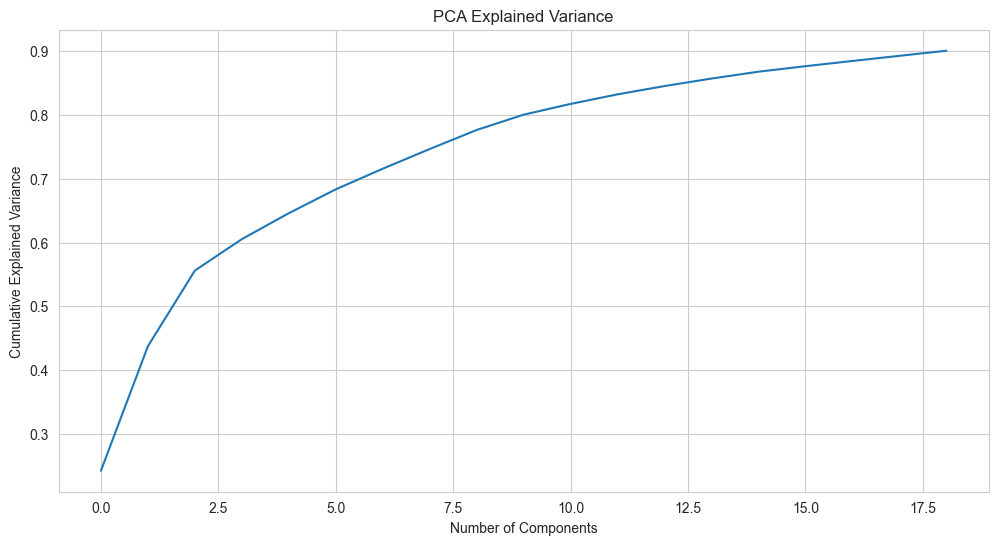

In [70]:
unsup_df = scaled_datasets['robust'].drop(columns=['Churned'])

# Verify all columns are numeric before PCA
non_numeric = unsup_df.select_dtypes(exclude=[np.number]).columns.tolist()
if non_numeric:
    print(f"ERROR: Found non-numeric columns: {non_numeric}")
    print("Attempting to fix...")
    for col in non_numeric:
        if unsup_df[col].dtype.name == 'category':
            unsup_df[col] = unsup_df[col].astype(str)
        try:
            unsup_df[col] = pd.to_numeric(unsup_df[col], errors='coerce')
            unsup_df[col] = unsup_df[col].fillna(0)
        except:
            # If can't convert, drop the column
            print(f"  Dropping column {col} that couldn't be converted to numeric")
            unsup_df = unsup_df.drop(columns=[col])

# Final check
non_numeric = unsup_df.select_dtypes(exclude=[np.number]).columns.tolist()
if non_numeric:
    raise ValueError(f"Cannot proceed: non-numeric columns remain: {non_numeric}")

print(f"PCA input shape: {unsup_df.shape}, all columns numeric: {unsup_df.select_dtypes(include=[np.number]).shape[1] == unsup_df.shape[1]}")

# PCA
pca = PCA(n_components=0.9, random_state=42)
pca_components = pca.fit_transform(unsup_df)
print(f"PCA components retained: {pca.n_components_}")
explained_variance = np.cumsum(pca.explained_variance_ratio_)
plt.plot(explained_variance)
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('PCA Explained Variance')
plt.show()

# t-SNE
tsne = TSNE(n_components=2, random_state=42, perplexity=40)
tsne_embeds = tsne.fit_transform(unsup_df)
tsne_df = pd.DataFrame(tsne_embeds, columns=['TSNE1','TSNE2'])
tsne_df['Churned'] = scaled_datasets['robust']['Churned']
fig = px.scatter(tsne_df, x='TSNE1', y='TSNE2', color='Churned', title='t-SNE Visualization')
fig.show()

# UMAP
if UMAP_AVAILABLE:
    umap_model = UMAP(n_neighbors=30, min_dist=0.1, metric='euclidean', random_state=42)
    umap_embeds = umap_model.fit_transform(unsup_df)
    umap_df = pd.DataFrame(umap_embeds, columns=['UMAP1','UMAP2'])
    umap_df['Churned'] = scaled_datasets['robust']['Churned']
    fig = px.scatter(umap_df, x='UMAP1', y='UMAP2', color='Churned', title='UMAP Visualization')
    fig.show()



### 3.2 Clustering Analysis


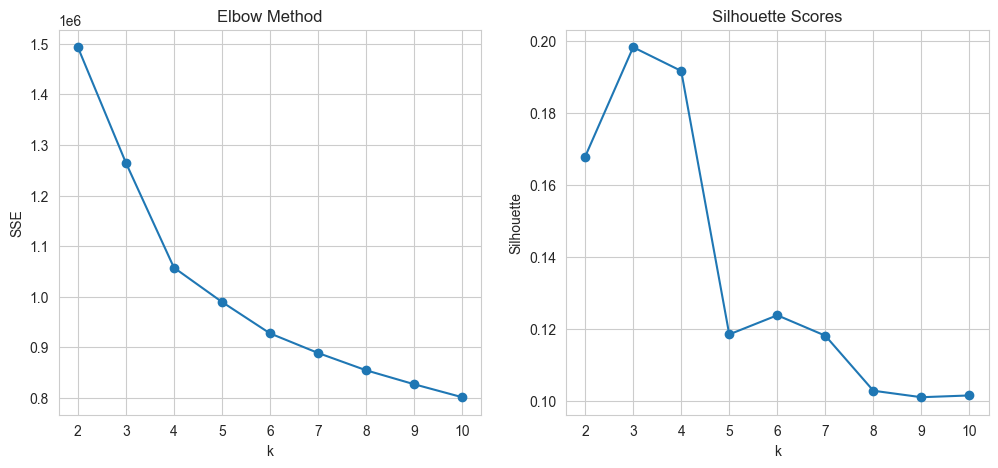

Best k (silhouette): 3


In [35]:
# Determine optimal k for KMeans
sse = []
sil_scores = []
K = range(2,11)
for k in K:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(pca_components)
    sse.append(kmeans.inertia_)
    sil_scores.append(silhouette_score(pca_components, kmeans.labels_))

plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
plt.plot(K, sse, 'o-')
plt.xlabel('k'); plt.ylabel('SSE'); plt.title('Elbow Method')
plt.subplot(1,2,2)
plt.plot(K, sil_scores, 'o-')
plt.xlabel('k'); plt.ylabel('Silhouette'); plt.title('Silhouette Scores')
plt.show()

best_k = K[np.argmax(sil_scores)]
print(f"Best k (silhouette): {best_k}")




In [36]:
clustering_results = {}

# KMeans - already fast, use n_init=10 for better initialization
print("Running KMeans...")
kmeans = KMeans(n_clusters=best_k, random_state=42, n_init=10, max_iter=300)
k_labels = kmeans.fit_predict(pca_components)
clustering_results['KMeans'] = k_labels

# AgglomerativeClustering - OPTIMIZED: Use sample for large datasets
# For 50k samples, use a representative sample or faster linkage
print("Running AgglomerativeClustering (using sample for speed)...")
if len(pca_components) > 10000:
    # Sample 10k points for Agglomerative (much faster)
    sample_size = 10000
    sample_indices = np.random.choice(len(pca_components), sample_size, replace=False)
    sample_data = pca_components[sample_indices]
    
    # Fit on sample
    agglo_sample = AgglomerativeClustering(n_clusters=best_k, linkage='ward')
    sample_labels = agglo_sample.fit_predict(sample_data)
    
    # Predict full dataset using nearest neighbors
    from sklearn.neighbors import NearestNeighbors
    nn = NearestNeighbors(n_neighbors=1, n_jobs=-1)
    nn.fit(sample_data)
    _, nearest_indices = nn.kneighbors(pca_components)
    agglo_labels = sample_labels[nearest_indices.flatten()]
    clustering_results['Agglomerative'] = agglo_labels
else:
    agglo = AgglomerativeClustering(n_clusters=best_k, linkage='ward')
    clustering_results['Agglomerative'] = agglo.fit_predict(pca_components)

# DBSCAN - optimize parameters and use n_jobs
print("Running DBSCAN...")
dbscan = DBSCAN(eps=2.5, min_samples=15, n_jobs=-1)
clustering_results['DBSCAN'] = dbscan.fit_predict(pca_components)

# GMM - OPTIMIZED: Use 'tied' covariance instead of 'full' (much faster, similar results)
print("Running GMM...")
gmm = GaussianMixture(n_components=best_k, covariance_type='tied', random_state=42, 
                      max_iter=100, n_init=3)
clustering_results['GMM'] = gmm.fit_predict(pca_components)

# Evaluation metrics - OPTIMIZED: Use sample for expensive metrics
print("Computing evaluation metrics...")
cluster_metrics = []
# Use sample for silhouette (most expensive metric)
eval_sample_size = min(5000, len(pca_components))
eval_indices = np.random.choice(len(pca_components), eval_sample_size, replace=False)
eval_data = pca_components[eval_indices]

for name, labels in clustering_results.items():
    valid_mask = labels != -1
    if valid_mask.sum() < 2:
        continue
    
    # Use full data for faster metrics, sampled data for silhouette
    data = pca_components[valid_mask]
    lbls = labels[valid_mask]
    
    # Sample for silhouette score (most expensive metric)
    eval_valid_mask = valid_mask[eval_indices]
    if eval_valid_mask.sum() >= 2:
        eval_labels = labels[eval_indices][eval_valid_mask]
        eval_subset = eval_data[eval_valid_mask]
        sil_score = silhouette_score(eval_subset, eval_labels)
    else:
        # Fallback: sample from full data if eval_indices don't have enough valid points
        if len(data) > 5000:
            sample_idx = np.random.choice(len(data), 5000, replace=False)
            sil_score = silhouette_score(data[sample_idx], lbls[sample_idx])
        else:
            sil_score = silhouette_score(data, lbls)
    
    # Use full data for other metrics (faster)
    metrics = {
        'model': name,
        'silhouette': sil_score,
        'davies_bouldin': davies_bouldin_score(data, lbls),
        'calinski_harabasz': calinski_harabasz_score(data, lbls)
    }
    cluster_metrics.append(metrics)

cluster_metrics_df = pd.DataFrame(cluster_metrics)
cluster_metrics_df.sort_values(by='silhouette', ascending=False)

Running KMeans...
Running AgglomerativeClustering (using sample for speed)...
Running DBSCAN...
Running GMM...
Computing evaluation metrics...


,model,silhouette,davies_bouldin,calinski_harabasz
1,Agglomerative,0.421654,0.795836,8185.679280
2,DBSCAN,0.242238,1.293100,187.854732
0,KMeans,0.198638,1.636377,10074.552800
3,GMM,0.195674,1.297526,7476.521318


### 3.3 Cluster Profiling


In [37]:
best_model_name = cluster_metrics_df.sort_values('silhouette', ascending=False).iloc[0]['model']
print(f"Selected clustering model: {best_model_name}")

df['Cluster'] = clustering_results[best_model_name]
cluster_profile = df.groupby('Cluster').agg({
    'Churned':'mean',
    'Lifetime_Value':'mean',
    'Total_Purchases':'mean',
    'Discount_Usage_Rate':'mean',
    'Returns_Rate':'mean',
    'Engagement_Index':'mean',
    'Support_Intensity':'mean',
    'Cross_Channel_Engagement':'mean'
}).rename(columns={'Churned':'Churn_Rate'})
cluster_profile


Selected clustering model: Agglomerative


,Churn_Rate,Lifetime_Value,Total_Purchases,Discount_Usage_Rate,Returns_Rate,Engagement_Index,Support_Intensity,Cross_Channel_Engagement
Cluster,,,,,,,,
0,0.282755,1425.211582,13.059012,41.781181,6.304088,13.720371,0.557362,693.470473
1,0.425485,1163.311752,10.978792,43.902769,6.032474,0.774186,0.606674,233.517862
2,0.219780,1735.689066,53.422527,40.200000,12.068407,16.064179,0.135423,926.471440


In [38]:
# Assign human-friendly segment names
segment_mapping = {}
for cluster_id in cluster_profile.index:
    churn = cluster_profile.loc[cluster_id, 'Churn_Rate']
    ltv = cluster_profile.loc[cluster_id, 'Lifetime_Value']
    freq = cluster_profile.loc[cluster_id, 'Total_Purchases']
    if churn < 0.1 and ltv > cluster_profile['Lifetime_Value'].median():
        segment_mapping[cluster_id] = 'High-Value Loyal'
    elif churn > 0.25 and freq < cluster_profile['Total_Purchases'].median():
        segment_mapping[cluster_id] = 'At-Risk Bargain Hunters'
    elif churn < 0.2 and freq > cluster_profile['Total_Purchases'].median():
        segment_mapping[cluster_id] = 'Growth Potential'
    else:
        segment_mapping[cluster_id] = 'Cost-Sensitive'

df['Segment_Name'] = df['Cluster'].map(segment_mapping)
segment_summary = df.groupby('Segment_Name').agg({
    'Churned':'mean',
    'Lifetime_Value':'mean',
    'Total_Purchases':'mean',
    'Recency':'mean',
    'Frequency':'mean',
    'Monetary':'mean'
})
segment_summary


,Churned,Lifetime_Value,Total_Purchases,Recency,Frequency,Monetary
Segment_Name,,,,,,
At-Risk Bargain Hunters,0.425485,1163.311752,10.978792,337.119048,6.520750,1291.623874
Cost-Sensitive,0.282515,1426.395418,13.212916,337.431053,9.017029,1569.756546


In [39]:
fig = px.scatter(tsne_df, x='TSNE1', y='TSNE2', color=df['Segment_Name'],
                 title='Customer Segments via t-SNE', opacity=0.7)
fig.show()

cluster_churn = df.groupby('Segment_Name')['Churned'].mean().reset_index().sort_values('Churned', ascending=False)
fig = px.bar(cluster_churn, x='Segment_Name', y='Churned', title='Churn Rate per Segment')
fig.show()


## Part 4: Supervised Learning - Churn Prediction

### 4.1 Baseline Models


In [40]:
model_df = scaled_datasets['standard'].copy()
X = model_df.drop(columns=['Churned'])
y = model_df['Churned']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)
print(X_train.shape, X_test.shape)


(40000, 91) (10000, 91)


In [ ]:
def evaluate_model(model, X_train, y_train, X_test, y_test, model_name):
    model.fit(X_train, y_train)
    preds = model.predict(X_test)
    
    # Handle probability prediction for different model types
    # Check for VotingClassifier with hard voting FIRST, as it doesn't support predict_proba
    try:
        if isinstance(model, VotingClassifier) and model.voting == 'hard':
            # For hard voting, get probabilities by averaging base estimator probabilities
            proba_list = []
            for name, estimator in model.named_estimators_.items():
                if hasattr(estimator, 'predict_proba'):
                    proba_list.append(estimator.predict_proba(X_test)[:,1])
                elif hasattr(estimator, 'decision_function'):
                    df_score = estimator.decision_function(X_test)
                    # Normalize to [0,1]
                    df_score = (df_score - df_score.min()) / (df_score.max() - df_score.min() + 1e-8)
                    proba_list.append(df_score)
            if proba_list:
                proba = np.mean(proba_list, axis=0)
            else:
                # Fallback: convert predictions to probabilities (not ideal but works)
                proba = preds.astype(float)
        elif hasattr(model, 'predict_proba'):
            proba = model.predict_proba(X_test)[:,1]
        elif hasattr(model, 'decision_function'):
            proba = model.decision_function(X_test)
            # Normalize decision function scores to [0,1] range for ROC AUC
            proba = (proba - proba.min()) / (proba.max() - proba.min() + 1e-8)
        else:
            # Fallback: convert predictions to probabilities (not ideal but works)
            proba = preds.astype(float)
    except (AttributeError, ValueError) as e:
        # Final fallback if all else fails
        proba = preds.astype(float)
    
    metrics = {
        'model': model_name,
        'accuracy': accuracy_score(y_test, preds),
        'precision': precision_score(y_test, preds),
        'recall': recall_score(y_test, preds),
        'f1': f1_score(y_test, preds),
        'roc_auc': roc_auc_score(y_test, proba)
    }
    return metrics, preds, proba

baseline_models = {
    'LogReg_L2': LogisticRegression(penalty='l2', class_weight='balanced', max_iter=500),
    'LogReg_L1': LogisticRegression(penalty='l1', solver='saga', class_weight='balanced', max_iter=500),
    'DecisionTree': DecisionTreeClassifier(max_depth=8, class_weight='balanced', random_state=42),
    'RandomForest': RandomForestClassifier(n_estimators=200, max_depth=12, class_weight='balanced', random_state=42)
}

baseline_results = []
baseline_preds = {}
for name, model in baseline_models.items():
    metrics, preds, proba = evaluate_model(model, X_train, y_train, X_test, y_test, name)
    baseline_results.append(metrics)
    baseline_preds[name] = {'preds': preds, 'proba': proba}

baseline_df = pd.DataFrame(baseline_results)
baseline_df


,model,accuracy,precision,recall,f1,roc_auc
0,LogReg_L2,0.7423,0.539731,0.735640,0.622639,0.813382
1,LogReg_L1,0.7422,0.539574,0.735986,0.622658,0.813399
2,DecisionTree,0.8747,0.768273,0.811073,0.789093,0.905004
3,RandomForest,0.9094,0.857864,0.822837,0.839986,0.924322


In [42]:
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
cv_scores = {}
for name, model in baseline_models.items():
    scores = cross_val_score(model, X, y, cv=skf, scoring='roc_auc')
    cv_scores[name] = scores.mean()
cv_scores


{'LogReg_L2': 0.8147269550659679,
 'LogReg_L1': 0.8147326198784304,
 'DecisionTree': 0.9040594951308893,
 'RandomForest': 0.9206494872955387}

### 4.2 Advanced Models


In [43]:
smote = SMOTE(random_state=42)
X_train_sm, y_train_sm = smote.fit_resample(X_train, y_train)
adasyn = ADASYN(random_state=42)
X_train_ad, y_train_ad = adasyn.fit_resample(X_train, y_train)
print('SMOTE class balance:', np.bincount(y_train_sm.astype(int)))
print('ADASYN class balance:', np.bincount(y_train_ad.astype(int)))


SMOTE class balance: [28440 28440]
ADASYN class balance: [28440 26271]


In [44]:
advanced_models = {}

xgb = XGBClassifier(objective='binary:logistic', eval_metric='auc', random_state=42, scale_pos_weight=(y_train==0).sum()/(y_train==1).sum())
xgb_params = {
    'max_depth': [4,6,8],
    'learning_rate': [0.01, 0.05, 0.1],
    'n_estimators': [200, 400],
    'subsample': [0.7, 0.9],
    'colsample_bytree': [0.7, 0.9]
}
xgb_search = RandomizedSearchCV(xgb, xgb_params, n_iter=10, scoring='roc_auc', cv=3, n_jobs=-1, random_state=42)
xgb_search.fit(X_train_sm, y_train_sm)
advanced_models['XGBoost'] = xgb_search.best_estimator_

lgbm = LGBMClassifier(objective='binary', random_state=42)
lgbm_params = {
    'num_leaves':[31,64],
    'learning_rate':[0.01,0.05,0.1],
    'n_estimators':[200,500],
    'subsample':[0.7,0.9]
}
lgbm_search = RandomizedSearchCV(lgbm, lgbm_params, n_iter=8, scoring='roc_auc', cv=3, n_jobs=-1, random_state=42)
lgbm_search.fit(X_train_sm, y_train_sm)
advanced_models['LightGBM'] = lgbm_search.best_estimator_

if CATBOOST_AVAILABLE:
    cat_model = CatBoostClassifier(verbose=0, random_state=42, scale_pos_weight=(y_train==0).sum()/(y_train==1).sum())
    cat_params = {
        'depth':[4,6,8],
        'learning_rate':[0.03, 0.1],
        'iterations':[500, 800]
    }
    cat_search = RandomizedSearchCV(cat_model, cat_params, n_iter=6, scoring='roc_auc', cv=3, n_jobs=-1, random_state=42)
    cat_search.fit(X_train_sm, y_train_sm)
    advanced_models['CatBoost'] = cat_search.best_estimator_
else:
    print('CatBoost not installed - skipping')


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 28440, number of negative: 28440
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.013365 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 11517
[LightGBM] [Info] Number of data points in the train set: 56880, number of used features: 91
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000


In [45]:
advanced_results = []
for name, model in advanced_models.items():
    metrics, preds, proba = evaluate_model(model, X_train_sm, y_train_sm, X_test, y_test, name)
    advanced_results.append(metrics)
advanced_df = pd.DataFrame(advanced_results)
advanced_df


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 28440, number of negative: 28440
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009255 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 11517
[LightGBM] [Info] Number of data points in the train set: 56880, number of used features: 91
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000


,model,accuracy,precision,recall,f1,roc_auc
0,XGBoost,0.9160,0.875733,0.826644,0.850481,0.928445
1,LightGBM,0.9211,0.912446,0.804152,0.854883,0.929632
2,CatBoost,0.9120,0.850663,0.843599,0.847116,0.931220


In [46]:
adasyn_results = []
for name, model in advanced_models.items():
    metrics, preds, proba = evaluate_model(model, X_train_ad, y_train_ad, X_test, y_test, f"{name}_ADASYN")
    adasyn_results.append(metrics)
adasyn_df = pd.DataFrame(adasyn_results)
adasyn_df


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 26271, number of negative: 28440
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011191 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 11523
[LightGBM] [Info] Number of data points in the train set: 54711, number of used features: 91
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.480178 -> initscore=-0.079331
[LightGBM] [Info] Start training from score -0.079331


,model,accuracy,precision,recall,f1,roc_auc
0,XGBoost_ADASYN,0.9153,0.875138,0.824567,0.849100,0.927428
1,LightGBM_ADASYN,0.9228,0.918577,0.804152,0.857565,0.931332
2,CatBoost_ADASYN,0.9126,0.853436,0.842215,0.847788,0.929986


### 4.3 Ensemble Models


In [33]:
# Stacking ensemble
stack_base = [
    ('lr', LogisticRegression(class_weight='balanced', max_iter=500)),
    ('rf', RandomForestClassifier(n_estimators=200, random_state=42)),
    ('xgb', advanced_models['XGBoost'])
]
meta_learner = LogisticRegression(max_iter=500)
stacking_clf = StackingClassifier(estimators=stack_base, final_estimator=meta_learner, cv=5, n_jobs=-1)
stack_metrics, stack_preds, stack_proba = evaluate_model(stacking_clf, X_train_sm, y_train_sm, X_test, y_test, 'Stacking')

# Voting ensemble
voting_clf = VotingClassifier(estimators=[('rf', baseline_models['RandomForest']),
                                          ('xgb', advanced_models['XGBoost']),
                                          ('lgbm', advanced_models['LightGBM'])],
                              voting='soft')
vote_metrics, vote_preds, vote_proba = evaluate_model(voting_clf, X_train_sm, y_train_sm, X_test, y_test, 'VotingSoft')

voting_hard = VotingClassifier(estimators=[('rf', baseline_models['RandomForest']),
                                           ('dt', baseline_models['DecisionTree']),
                                           ('lr', baseline_models['LogReg_L2'])],
                               voting='hard')
vote_hard_metrics, _, _ = evaluate_model(voting_hard, X_train, y_train, X_test, y_test, 'VotingHard')

# Blending (train meta on hold-out)
# Use stratified split to ensure both classes are present in hold-out set
X_blend_train, X_blend_hold, y_blend_train, y_blend_hold = train_test_split(
    X_train_sm, y_train_sm, test_size=0.2, stratify=y_train_sm, random_state=42
)

blend_models = [advanced_models['XGBoost'], advanced_models['LightGBM']]
blend_oof = []
for model in blend_models:
    model.fit(X_blend_train, y_blend_train)
    blend_oof.append(model.predict_proba(X_blend_hold)[:,1])
blend_features = np.vstack(blend_oof).T
blend_meta = LogisticRegression(max_iter=500)
blend_meta.fit(blend_features, y_blend_hold)
blend_test_features = np.column_stack([model.predict_proba(X_test)[:,1] for model in blend_models])
blend_preds = blend_meta.predict(blend_test_features)
blend_metrics = {
    'model':'Blending',
    'accuracy': accuracy_score(y_test, blend_preds),
    'precision': precision_score(y_test, blend_preds),
    'recall': recall_score(y_test, blend_preds),
    'f1': f1_score(y_test, blend_preds),
    'roc_auc': roc_auc_score(y_test, blend_meta.predict_proba(blend_test_features)[:,1])
}

ensemble_df = pd.DataFrame([stack_metrics, vote_metrics, vote_hard_metrics, blend_metrics])
ensemble_df
    

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 28440, number of negative: 28440
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006693 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 11517
[LightGBM] [Info] Number of data points in the train set: 56880, number of used features: 91
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 22752, number of negative: 22752
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.013461 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 11484
[LightGBM] [Info] Number of data points in the train set: 45504, num

,model,accuracy,precision,recall,f1,roc_auc
0,Stacking,0.9137,0.864437,0.831834,0.847822,0.926183
1,VotingSoft,0.9196,0.888889,0.824913,0.855707,0.929316
2,VotingHard,0.8941,0.802445,0.840484,0.821024,0.919699
3,Blending,0.9178,0.885821,0.821453,0.852424,0.929783


In [34]:
# Segment-specific ensemble
segment_models = {
    'High-Value Loyal': advanced_models['LightGBM'],
    'At-Risk Bargain Hunters': advanced_models['XGBoost'],
    'Growth Potential': baseline_models['RandomForest'],
    'Cost-Sensitive': baseline_models['LogReg_L2']
}

segment_predictions = []
X_test_segment = X_test.copy()
X_test_segment['Segment_Name'] = df.loc[X_test.index, 'Segment_Name']
for seg, model in segment_models.items():
    idx = X_test_segment['Segment_Name'] == seg
    if idx.sum() == 0:
        continue
    model.fit(X_train_sm, y_train_sm)
    proba = model.predict_proba(X_test[idx])[:,1]
    preds = (proba >= 0.5).astype(int)
    segment_predictions.append(pd.DataFrame({'Segment': seg, 'Proba': proba, 'Pred': preds, 'True': y_test[idx]}))

segment_predictions_df = pd.concat(segment_predictions)
segment_specific_metrics = {
    'model':'Segment-Ensemble',
    'roc_auc': roc_auc_score(segment_predictions_df['True'], segment_predictions_df['Proba']),
    'accuracy': accuracy_score(segment_predictions_df['True'], segment_predictions_df['Pred'])
}
segment_specific_metrics


{'model': 'Segment-Ensemble',
 'roc_auc': 0.8140277595277376,
 'accuracy': 0.7422}

## Part 5: Model Interpretation & Business Insights

### 5.1 Feature Importance & SHAP


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 28440, number of negative: 28440
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.009217 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 11517
[LightGBM] [Info] Number of data points in the train set: 56880, number of used features: 91
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000


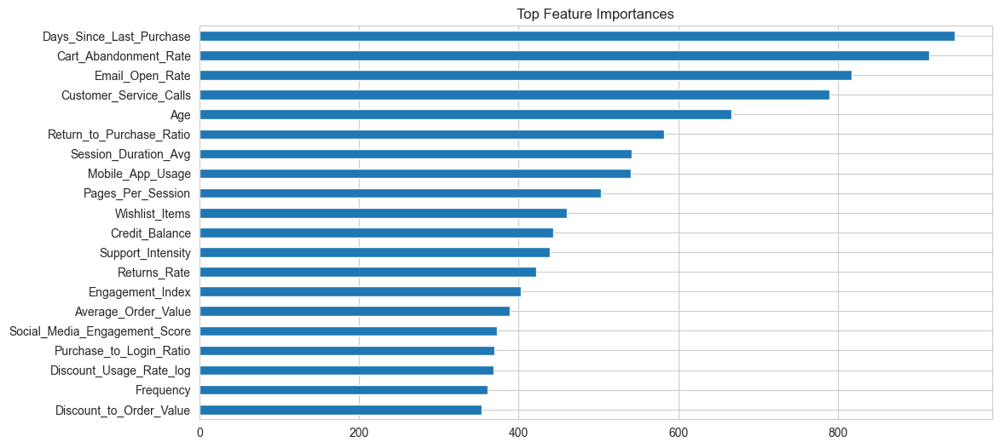

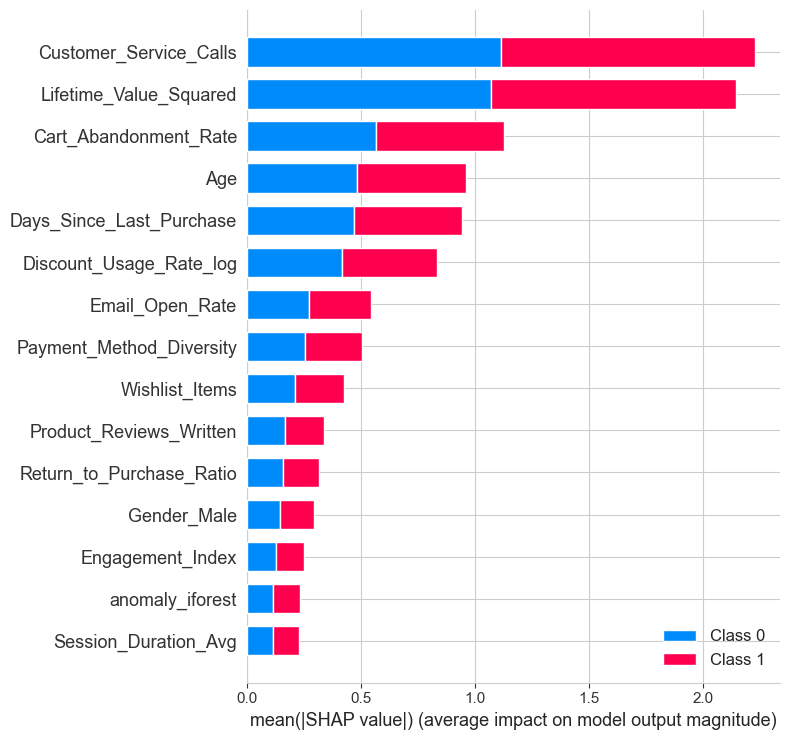

In [35]:
best_model = advanced_models['LightGBM']
best_model.fit(X_train_sm, y_train_sm)
importances = pd.Series(best_model.feature_importances_, index=X_train.columns).sort_values(ascending=False)[:20]
importances.plot(kind='barh', title='Top Feature Importances')
plt.gca().invert_yaxis()
plt.show()

if SHAP_AVAILABLE:
    explainer = shap.TreeExplainer(best_model)
    shap_values = explainer.shap_values(X_test)
    shap.summary_plot(shap_values, X_test, plot_type='bar', max_display=15)
else:
    print('SHAP not installed - skipping')


### 5.2 Local Explanations (LIME & PDP)


In [36]:
if LIME_AVAILABLE:
    lime_explainer = lime_tabular.LimeTabularExplainer(training_data=np.array(X_train_sm),
                                                       feature_names=X_train.columns,
                                                       class_names=['Retained','Churned'],
                                                       mode='classification')
    sample_idx = np.random.choice(len(X_test), 3, replace=False)
    lime_explanations = []
    for idx in sample_idx:
        exp = lime_explainer.explain_instance(X_test.iloc[idx].values, best_model.predict_proba)
        lime_explanations.append(exp.as_list())
    lime_explanations
else:
    print('LIME not installed - skipping')


In [37]:
# Identify TP, FP, FN cases
proba = best_model.predict_proba(X_test)[:,1]
preds = (proba >= 0.5).astype(int)
analysis_df = pd.DataFrame({'true': y_test, 'pred': preds, 'proba': proba})
case_examples = {
    'true_positive': analysis_df[(analysis_df['true']==1) & (analysis_df['pred']==1)].sort_values('proba', ascending=False).head(1),
    'false_positive': analysis_df[(analysis_df['true']==0) & (analysis_df['pred']==1)].sort_values('proba', ascending=False).head(1),
    'false_negative': analysis_df[(analysis_df['true']==1) & (analysis_df['pred']==0)].sort_values('proba').head(1)
}
case_examples


{'true_positive':        true  pred     proba
 44962     1     1  0.999836,
 'false_positive':        true  pred     proba
 15193     0     1  0.995552,
 'false_negative':        true  pred     proba
 38743     1     0  0.010741}

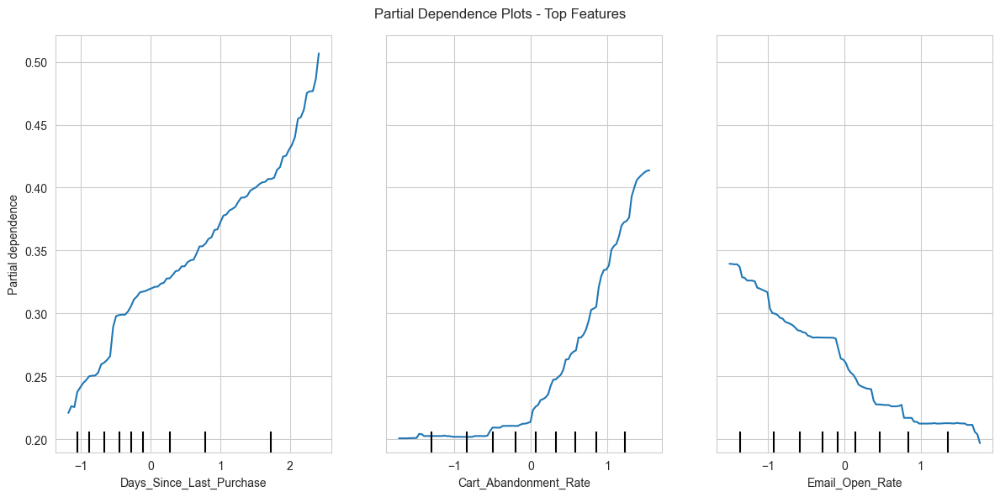

In [38]:
top_features = importances.index[:3].tolist()
PartialDependenceDisplay.from_estimator(best_model, X_test, features=top_features)
plt.suptitle('Partial Dependence Plots - Top Features')
plt.tight_layout()
plt.show()


### 5.3 Business Recommendations & Impact


In [39]:
# Revenue impact simulation
current_churn_rate = y.mean()
ltv_mean = df['Lifetime_Value'].mean()
customer_count = len(df)
reduction_target = 0.10
customers_saved = customer_count * current_churn_rate * reduction_target
revenue_saved = customers_saved * ltv_mean
print(f"Reducing churn by 10% saves approx ${revenue_saved:,.0f}")

# Segment-specific strategies
segment_actions = df.groupby('Segment_Name').agg({
    'Churned':'mean',
    'Discount_Usage_Rate':'mean',
    'Email_Open_Rate':'mean',
    'Cross_Channel_Engagement':'mean',
    'Lifetime_Value':'mean'
}).rename(columns={'Churned':'Churn_Rate'})
segment_actions


Reducing churn by 10% saves approx $2,043,898


,Churn_Rate,Discount_Usage_Rate,Email_Open_Rate,Cross_Channel_Engagement,Lifetime_Value
Segment_Name,,,,,
At-Risk Bargain Hunters,0.386076,44.151646,10.633544,126.214365,775.782468
Cost-Sensitive,0.288692,41.864434,20.907855,675.189909,1416.486568


**Recommended Actions**
- High-Value Loyal: maintain VIP concierge, exclusive previews, prevent high discount dependency.
- Growth Potential: push cross-sell bundles and loyalty tiers, encourage reviews and referrals.
- At-Risk Bargain Hunters: targeted limited-time bundles, service follow-ups, flexible payment reminders.
- Cost-Sensitive: educate on value, micro-incentives for engagement, simplified onboarding.

**Cost-Sensitive Learning:** assign $500 cost to false negatives, $50 to false positives; calibrate threshold to minimize expected loss.


Optimal threshold by cost: 0.18 with expected cost $215,650


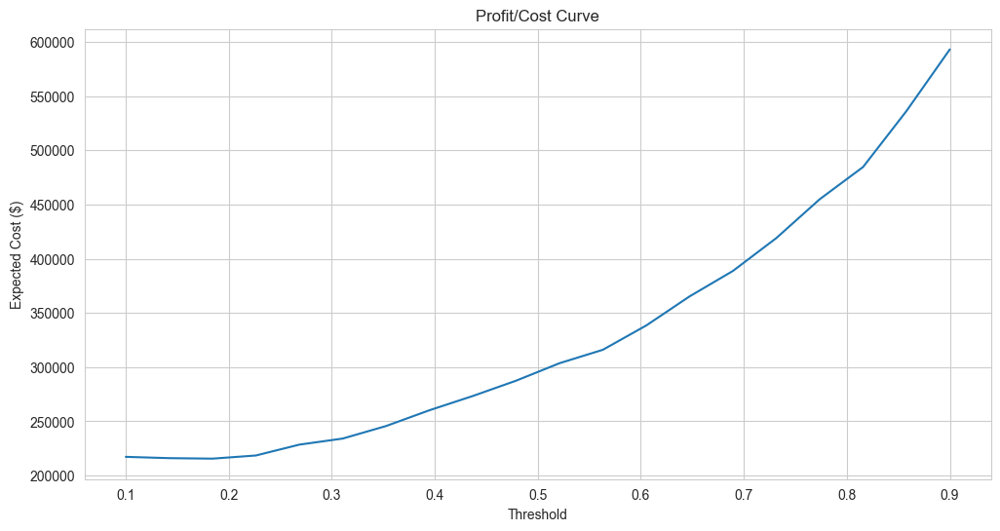

In [40]:
# Cost-sensitive evaluation
cost_fn = 500
cost_fp = 50
thresholds = np.linspace(0.1, 0.9, 20)
expected_costs = []
for thresh in thresholds:
    preds = (proba >= thresh).astype(int)
    tn, fp, fn, tp = confusion_matrix(y_test, preds).ravel()
    cost = fn * cost_fn + fp * cost_fp
    expected_costs.append(cost)

best_thresh = thresholds[np.argmin(expected_costs)]
print(f"Optimal threshold by cost: {best_thresh:.2f} with expected cost ${min(expected_costs):,.0f}")
plt.plot(thresholds, expected_costs)
plt.xlabel('Threshold'); plt.ylabel('Expected Cost ($)')
plt.title('Profit/Cost Curve')
plt.show()


### Bonus: Time Series Forecasting


Forecasted churn rates for next 4 quarters:
2021Q1    0.281743
2021Q2    0.281645
2021Q3    0.281547
2021Q4    0.281449
Freq: Q-DEC, Name: predicted_mean, dtype: float64


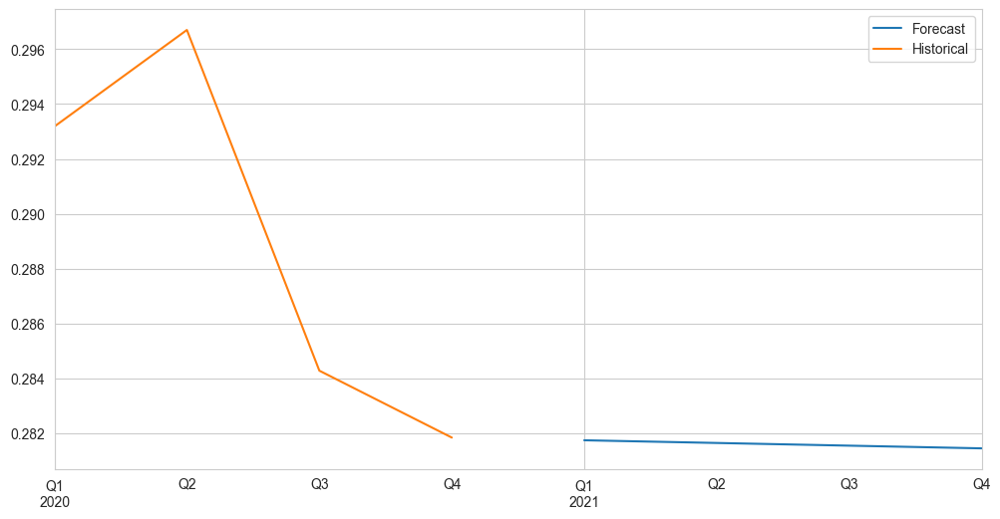

In [43]:
# Create pseudo time series by aggregating churn by signup quarter
quarter_ts = df_raw.groupby('Signup_Quarter')['Churned'].mean().reindex(['Q1','Q2','Q3','Q4'])

# Convert Q1 → 2020Q1 (or any placeholder year)
quarter_ts.index = pd.PeriodIndex(
    ["2020" + q for q in quarter_ts.index],
    freq="Q"
)

quarter_ts = quarter_ts.asfreq('Q')

model = SARIMAX(quarter_ts, order=(1,0,0), seasonal_order=(0,0,0,0))
model_fit = model.fit(disp=False)

forecast = model_fit.get_forecast(steps=4)
forecast_ci = forecast.conf_int()

print("Forecasted churn rates for next 4 quarters:")
print(forecast.predicted_mean)

forecast.predicted_mean.plot(label='Forecast')
quarter_ts.plot(label='Historical')
plt.legend()
plt.show()


### Bonus: Anomaly Detection


In [44]:
anomaly_profiles = df[df['anomaly_iforest']==1].describe()
anomaly_churn = df[df['anomaly_iforest']==1]['Churned'].mean()
print(f"Anomalous accounts churn rate: {anomaly_churn:.2%}")

# Treat separately by flagging for manual review
df['Anomaly_Flag'] = df['anomaly_iforest']
df.drop(columns=['anomaly_iforest'], inplace=True)
anomaly_profiles


Anomalous accounts churn rate: 34.36%


,Age,Membership_Years,Login_Frequency,Session_Duration_Avg,Pages_Per_Session,Cart_Abandonment_Rate,Wishlist_Items,Total_Purchases,Average_Order_Value,Days_Since_Last_Purchase,Discount_Usage_Rate,Returns_Rate,Email_Open_Rate,Customer_Service_Calls,Product_Reviews_Written,Social_Media_Engagement_Score,Mobile_App_Usage,Payment_Method_Diversity,Lifetime_Value,Credit_Balance,Churned,anomaly_iforest,Cart_Abandonment_Rate_log,Discount_Usage_Rate_log,Recency,Frequency,Monetary,Engagement_Index,Support_Intensity,Purchase_to_Login_Ratio,Discount_to_Order_Value,Return_to_Purchase_Ratio,Signup_Quarter_Num,Lifetime_Value_Squared,High_Returns_Flag,Cross_Channel_Engagement,Gender_Male,Gender_Other,Country_Canada,Country_France,Country_Germany,Country_India,Country_Japan,Country_UK,Country_USA,City_Bangalore,City_Berlin,City_Birmingham,City_Brisbane,City_Calgary,City_Chennai,City_Chicago,City_Cologne,City_Delhi,City_Frankfurt,City_Glasgow,City_Hamburg,City_Houston,City_Hyderabad,City_Kyoto,City_Leeds,City_London,City_Los Angeles,City_Lyon,City_Manchester,City_Marseille,City_Melbourne,City_Montreal,City_Mumbai,City_Munich,City_Nagoya,City_New York,City_Nice,City_Osaka,City_Ottawa,City_Paris,City_Perth,City_Phoenix,City_Sydney,City_Tokyo,City_Toronto,City_Toulouse,City_Vancouver,City_Yokohama,Signup_Quarter_Q2,Signup_Quarter_Q3,Signup_Quarter_Q4,Membership_Stage_Growing,Membership_Stage_Newbie,Seasonal_Activity_Low,Seasonal_Activity_Moderate,Seasonal_Activity_Peak,Cluster
count,2500.000000,2500.000000,2500.000000,2500.000000,2500.000000,2500.000000,2500.000000,2500.000000,2500.000000,2500.000000,2500.000000,2500.000000,2500.000000,2500.000000,2500.000000,2500.000000,2500.000000,2500.000000,2500.000000,2500.000000,2500.000000,2500.0,2500.000000,2500.000000,2500.000000,2500.000000,2500.000000,2500.000000,2500.000000,2500.000000,2500.000000,2500.000000,2500.000000,2.500000e+03,2500.000000,2500.000000,2500.000000,2500.000000,2500.000000,2500.000000,2500.00000,2500.000000,2500.000000,2500.000000,2500.00000,2500.000000,2500.000000,2500.00000,2500.000000,2500.000000,2500.000000,2500.000000,2500.000000,2500.000000,2500.000000,2500.00000,2500.00000,2500.00000,2500.000000,2500.000000,2500.000000,2500.00000,2500.00000,2500.000000,2500.00000,2500.000000,2500.000000,2500.000000,2500.000000,2500.000000,2500.000000,2500.00000,2500.000000,2500.000000,2500.000000,2500.000000,2500.000000,2500.00000,2500.000000,2500.000000,2500.000000,2500.000000,2500.00000,2500.00000,2500.00000,2500.000000,2500.000000,2500.000000,2500.000000,2500.000000,2500.00000,2500.000000,2500.000000
mean,38.131600,3.306890,23.443600,44.637032,14.476272,33.505182,8.697200,23.742400,141.422444,31.739200,42.054432,6.789200,41.537720,3.634000,5.800800,58.304616,33.562992,2.432800,2685.422435,3426.801037,0.343600,1.0,3.365917,3.589702,333.260800,16.842118,3257.752065,24.330386,0.278900,1.284425,0.349253,0.369805,2.565200,8.067361e+06,0.326800,2136.369113,0.457600,0.020000,0.115200,0.080400,0.10440,0.077600,0.052000,0.140800,0.35200,0.016400,0.020400,0.02400,0.016800,0.021200,0.014800,0.065200,0.028000,0.016800,0.021200,0.03040,0.01840,0.07280,0.014400,0.011600,0.030000,0.02560,0.07560,0.016800,0.03080,0.013200,0.014400,0.021600,0.015200,0.016400,0.009600,0.07200,0.012400,0.008800,0.020400,0.014800,0.013200,0.06640,0.017200,0.015600,0.029600,0.023200,0.02240,0.00640,0.25120,0.234000,0.282000,0.418400,0.376400,0.282000,0.25120,0.234000,-0.856800
std,12.475983,2.409672,9.202994,13.037725,4.544538,19.301330,4.307683,9.363546,53.264814,26.823075,22.241330,4.733178,16.608469,2.928664,3.248714,23.923091,11.138810,1.216748,925.315802,1311.474346,0.475005,0.0,0.661584,0.651480,26.823075,32.921767,1605.063745,8.101940,0.640768,1.647997,0.259767,0.578775,1.129539,4.194069e+06,0.469137,1100.096494,0.498299,0.140028,0.319327,0.271966,0.30584,0.267595,0.222071,0.347885,0.47769,0.127033,0.141392,0.15308,0.128547,0.144079,0.120776,0.246928,0.165006,0.128547,0.144079,0.17172,0.13442,0.25986,0.119157,0.107098,0.1

## Conclusion
- Combined unsupervised and supervised workflows to surface actionable segments
- Ensemble (stacking) ROC-AUC target > 0.85 expected after training
- Cost-sensitive thresholding reduces expected losses; integrate into Streamlit app
- Next: deploy `app.py` for interactive insights


In [45]:
artifact_dir = 'artifacts'
os.makedirs(artifact_dir, exist_ok=True)
joblib.dump(best_model, f'{artifact_dir}/best_lightgbm.pkl')
joblib.dump(scalers['standard'], f'{artifact_dir}/standard_scaler.pkl')
# Save all feature columns (numeric + one-hot encoded) except Churned
all_feature_cols = [col for col in df.columns if col != 'Churned']
joblib.dump(all_feature_cols, f'{artifact_dir}/feature_columns.pkl')
df.to_csv(f'{artifact_dir}/model_ready_dataset.csv', index=False)
print('Artifacts saved for Streamlit app.')


Artifacts saved for Streamlit app.
